## Imports e carregamento

In [1]:
#!pip install kagglehub
#!pip install yellowbrick

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer


from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.pipeline import Pipeline

from sklearn.decomposition import PCA

In [3]:
import kagglehub
from kagglehub import KaggleDatasetAdapter

df = kagglehub.dataset_load(
  KaggleDatasetAdapter.PANDAS,
  "arjunbhasin2013/ccdata",
  "CC GENERAL.csv",
)

df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


| Coluna                           | Descrição                                                                                  | Tipo      |
|----------------------------------|--------------------------------------------------------------------------------------------|-----------|
| CUST_ID                          | Identificação do titular do cartão de crédito                                              | Nominal   |
| BALANCE                          | Saldo disponível na conta para realizar compras                                            | Contínua  |
| BALANCE_FREQUENCY                | Frequência de atualização do saldo (score de 0 a 1)                                        | Contínua  |
| PURCHASES                        | Valor total de compras realizadas na conta                                                 | Contínua  |
| ONEOFF_PURCHASES                 | Valor máximo de compra realizada de uma só vez                                             | Contínua  |
| INSTALLMENTS_PURCHASES           | Valor total de compras realizadas em parcelas                                              | Contínua  |
| CASH_ADVANCE                     | Valor de adiantamento em dinheiro solicitado pelo usuário                                  | Contínua  |
| PURCHASES_FREQUENCY              | Frequência com que compras são realizadas (score de 0 a 1)                                 | Contínua  |
| ONEOFF_PURCHASES_FREQUENCY       | Frequência de compras realizadas de uma só vez (score de 0 a 1)                            | Contínua  |
| PURCHASES_INSTALLMENTS_FREQUENCY | Frequência de compras realizadas em parcelas (score de 0 a 1)                              | Contínua  |
| CASH_ADVANCE_FREQUENCY           | Frequência com que o adiantamento em dinheiro é utilizado                                  | Contínua  |
| CASH_ADVANCE_TRX                 | Número de transações realizadas com adiantamento em dinheiro                               | Discreta  |
| PURCHASES_TRX                    | Número de transações de compra realizadas                                                  | Discreta  |
| CREDIT_LIMIT                     | Limite do cartão de crédito do usuário                                                     | Contínua  |
| PAYMENTS                         | Valor total de pagamentos realizados pelo usuário                                          | Contínua  |
| MINIMUM_PAYMENTS                 | Valor mínimo de pagamentos realizados pelo usuário                                         | Contínua  |
| PRC_FULL_PAYMENT                 | Percentual de pagamento total realizado pelo usuário                                       | Contínua  |
| TENURE                           | Tempo de uso do serviço do cartão de crédito (em meses)                                    | Discreta  |

## Pre-processamento e Análise exploratória

In [4]:
df.duplicated().sum()

np.int64(0)

In [5]:
# checando por valores negativos
(df.select_dtypes(include=np.number) < 0).sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [6]:
# checando por valores negativos em colunas de frequência
freq_cols = [
    "BALANCE_FREQUENCY",
    "PURCHASES_FREQUENCY",
    "ONEOFF_PURCHASES_FREQUENCY",
    "PURCHASES_INSTALLMENTS_FREQUENCY",
    "CASH_ADVANCE_FREQUENCY",
    "PRC_FULL_PAYMENT",
]

((df[freq_cols] < 0) | (df[freq_cols] > 1)).sum()

BALANCE_FREQUENCY                   0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              8
PRC_FULL_PAYMENT                    0
dtype: int64

8 valores maiores que 1 em CASH_ADVANCE_FREQUENCY, coluna já é removida na seleção de features, não fazer nada. apenas um problema na qualidade dos dados

In [7]:
df[df['CASH_ADVANCE_FREQUENCY'] > 1]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
681,C10708,5656.069801,1.000000,362.36,362.36,0.0,7240.433194,0.250000,0.250000,0.0,1.250000,12,2,8000.0,683.421497,2036.877611,0.0,8
1626,C11680,2876.009336,1.000000,152.61,152.61,0.0,3719.650168,0.333333,0.333333,0.0,1.166667,24,2,4000.0,248.342971,584.926336,0.0,6
2555,C12629,5906.184924,1.000000,141.80,141.80,0.0,1651.286918,0.125000,0.125000,0.0,1.125000,12,2,10000.0,933.969974,919.289675,0.0,8
2608,C12684,7801.511533,1.000000,231.40,231.40,0.0,4109.465221,0.100000,0.100000,0.0,1.100000,20,3,13500.0,1593.617739,1522.496755,0.0,10
3038,C13127,3846.742530,1.000000,0.00,0.00,0.0,1932.460679,0.000000,0.000000,0.0,1.500000,18,0,5600.0,496.245836,538.346874,0.0,6
3253,C13347,5709.486507,0.833333,0.00,0.00,0.0,2794.326341,0.000000,0.000000,0.0,1.166667,10,0,6000.0,550.513331,1299.463370,0.0,6
8055,C18273,1917.895730,1.000000,285.07,285.07,0.0,6084.858872,0.363636,0.363636,0.0,1.090909,28,6,3000.0,5692.682993,556.449635,0.0,11
8365,C18588,3857.562230,1.000000,0.00,0.00,0.0,2127.213754,0.000000,0.000000,0.0,1.142857,26,0,5000.0,617.508991,538.396872,0.0,7


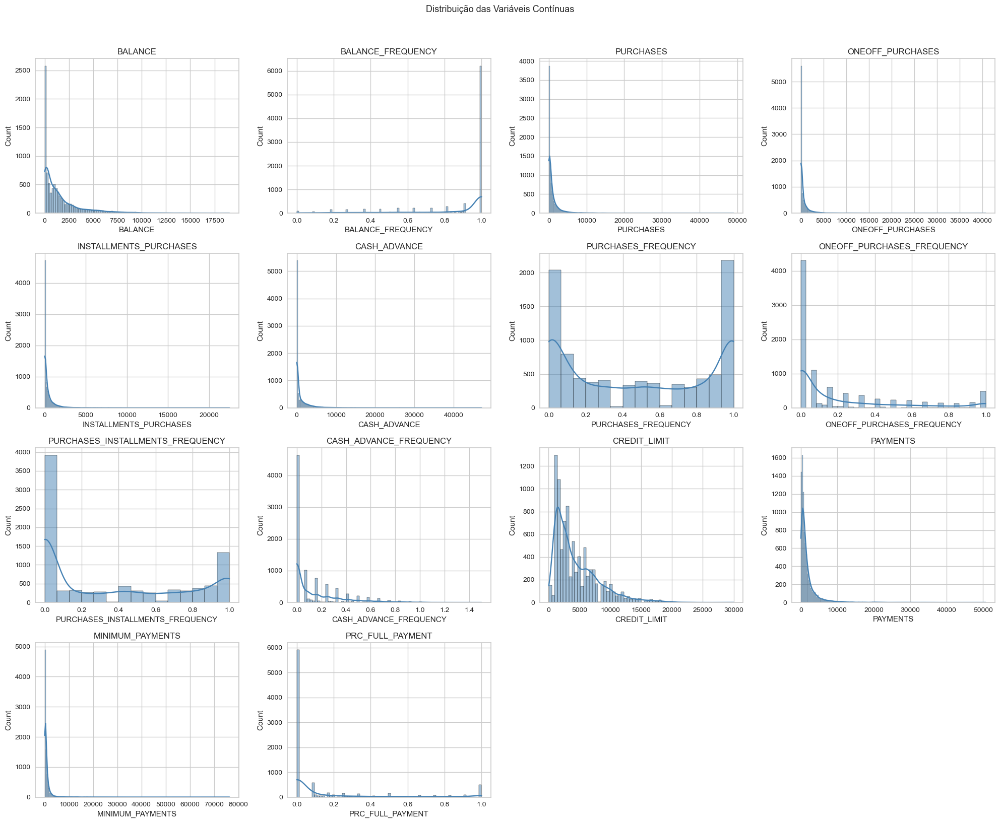

In [8]:
continuous_cols = [
    "BALANCE", "BALANCE_FREQUENCY", "PURCHASES", "ONEOFF_PURCHASES",
    "INSTALLMENTS_PURCHASES", "CASH_ADVANCE", "PURCHASES_FREQUENCY",
    "ONEOFF_PURCHASES_FREQUENCY", "PURCHASES_INSTALLMENTS_FREQUENCY",
    "CASH_ADVANCE_FREQUENCY", "CREDIT_LIMIT", "PAYMENTS",
    "MINIMUM_PAYMENTS", "PRC_FULL_PAYMENT",
]

fig, axes = plt.subplots(4, 4, figsize=(20, 16))
axes = axes.flatten()

for ax, col in zip(axes, continuous_cols):
    sns.histplot(df[col].dropna(), kde=True, ax=ax, color="steelblue")
    ax.set_title(col)

for j in range(len(continuous_cols), len(axes)):
    axes[j].set_visible(False)

plt.suptitle("Distribuição das Variáveis Contínuas", y=1.02, fontsize=13)
plt.tight_layout()
plt.show()

Não mostrar todos os gráficos na apresentação, só os mais importantes 

In [9]:
df.drop(columns=["CUST_ID"], inplace=True)

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8950.0,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.13856
BALANCE_FREQUENCY,8950.0,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.00000
PURCHASES,8950.0,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.57000
ONEOFF_PURCHASES,8950.0,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.25000
INSTALLMENTS_PURCHASES,8950.0,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.00000
CASH_ADVANCE,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.21176
PURCHASES_FREQUENCY,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.00000
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.00000
CASH_ADVANCE_FREQUENCY,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.50000


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8950 non-null   float64
 1   BALANCE_FREQUENCY                 8950 non-null   float64
 2   PURCHASES                         8950 non-null   float64
 3   ONEOFF_PURCHASES                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES            8950 non-null   float64
 5   CASH_ADVANCE                      8950 non-null   float64
 6   PURCHASES_FREQUENCY               8950 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 10  CASH_ADVANCE_TRX                  8950 non-null   int64  
 11  PURCHASES_TRX                     8950 non-null   int64  
 12  CREDIT

In [12]:
missing_values_= df.isnull().sum().sort_values(ascending=False).head()
columns_with_missing_values = missing_values_[missing_values_ > 0].index

In [13]:
# numero de valores faltantes por coluna
missing_values_[columns_with_missing_values]

MINIMUM_PAYMENTS    313
CREDIT_LIMIT          1
dtype: int64

In [14]:
# porcentagem de valores faltantes
(df.isnull().sum().sort_values(ascending=False).head() / df.shape[0]) * 100

MINIMUM_PAYMENTS          3.497207
CREDIT_LIMIT              0.011173
BALANCE                   0.000000
CASH_ADVANCE_FREQUENCY    0.000000
PRC_FULL_PAYMENT          0.000000
dtype: float64

Não vale a pena imputar para essa observação

In [15]:
df[df['CREDIT_LIMIT'].isnull()]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


In [16]:
df['CREDIT_LIMIT'].median()

3000.0

In [17]:
# removido pois a maioria dos valores faltantes estão concentrados nessa coluna e a mediana pode não ser representativa
df = df.dropna(subset=['CREDIT_LIMIT'])

In [18]:
imputer = SimpleImputer(strategy="median")
pipeline = Pipeline(steps=[("imputer", imputer)])

df[columns_with_missing_values] = pipeline.fit_transform(df[columns_with_missing_values])

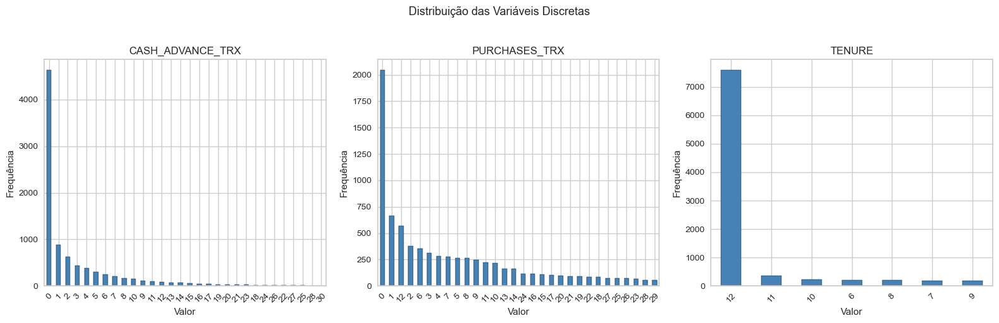

In [19]:
count_cols = ['CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'TENURE']

fig, axes = plt.subplots(1, len(count_cols), figsize=(16, 5))

for ax, col in zip(axes, count_cols):
    df[col].value_counts().sort_values(ascending=False).head(30).plot(kind="bar", ax=ax, color="steelblue", edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Valor")
    ax.set_ylabel("Frequência")
    ax.tick_params(axis="x", rotation=45)

plt.suptitle("Distribuição das Variáveis Discretas", y=1.02, fontsize=13)
plt.tight_layout()
plt.show()

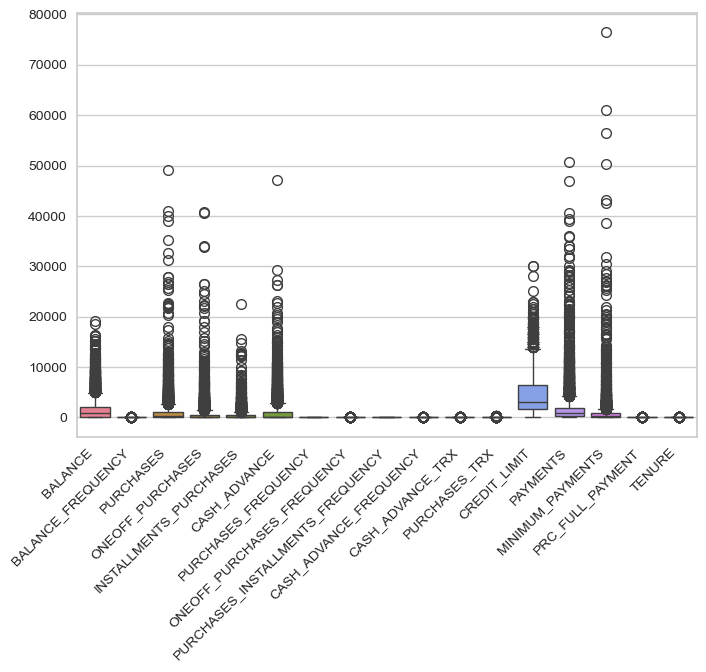

In [20]:
sns.boxplot(data=df)
plt.xticks(rotation=45, ha="right")
plt.show()

Informação se perde após 12 meses. melhor manter assim que remover.

In [21]:
print(f"TENURE - valores únicos: {sorted(df['TENURE'].unique())}")
print(f"TENURE - desvio padrão: {df['TENURE'].std():.3f}")

(df["TENURE"].value_counts(normalize=True).sort_index() * 100).round(2)

TENURE - valores únicos: [np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12)]
TENURE - desvio padrão: 1.337


TENURE
6      2.27
7      2.12
8      2.19
9      1.96
10     2.64
11     4.08
12    84.75
Name: proportion, dtype: float64

Mesmo com valores acumulados em 12 meses, manter, pois ainda é capaz de segmentar clientes

## Análise Visual com Dois Atributos

buscar por atributos melhores dos que eu selecionei, e identificar a lógica deles para a regra de negócio

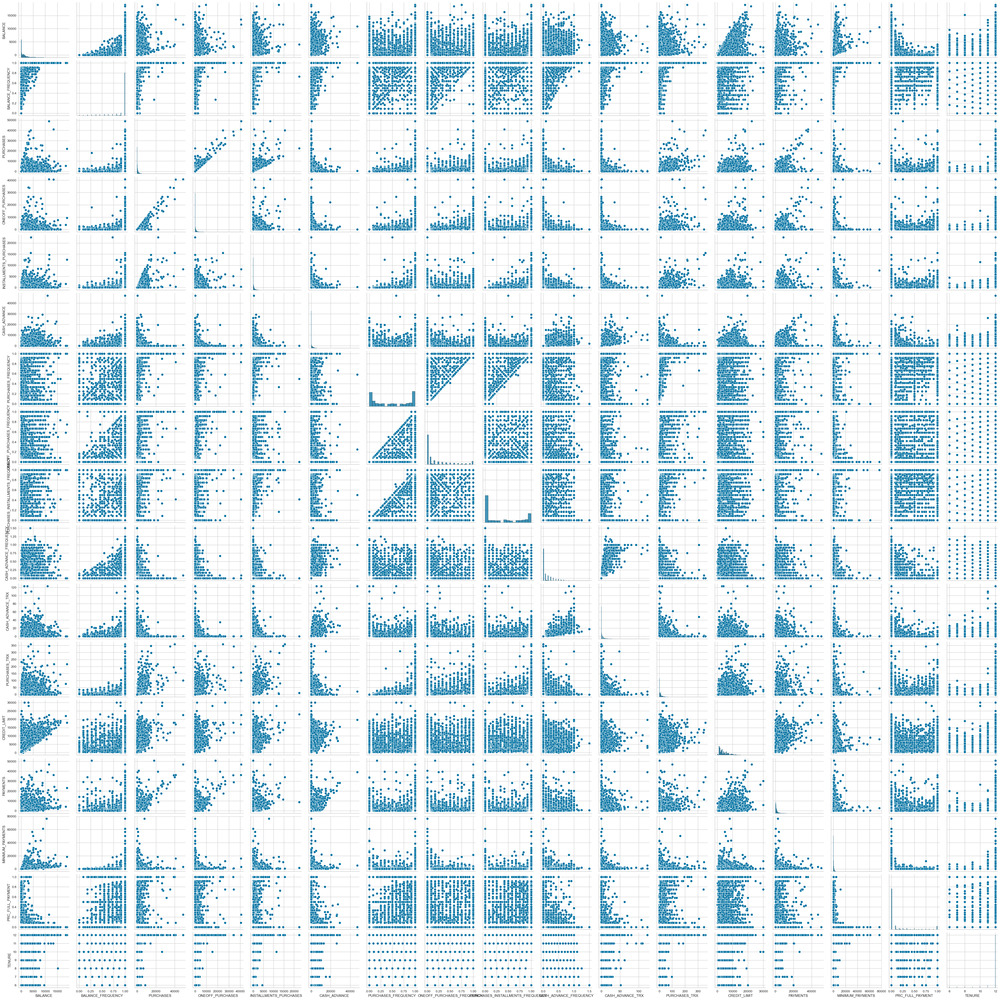

In [22]:
sns.pairplot(df)

gráficos de densidade pois imaginei que facilitaria a identificação de clusters

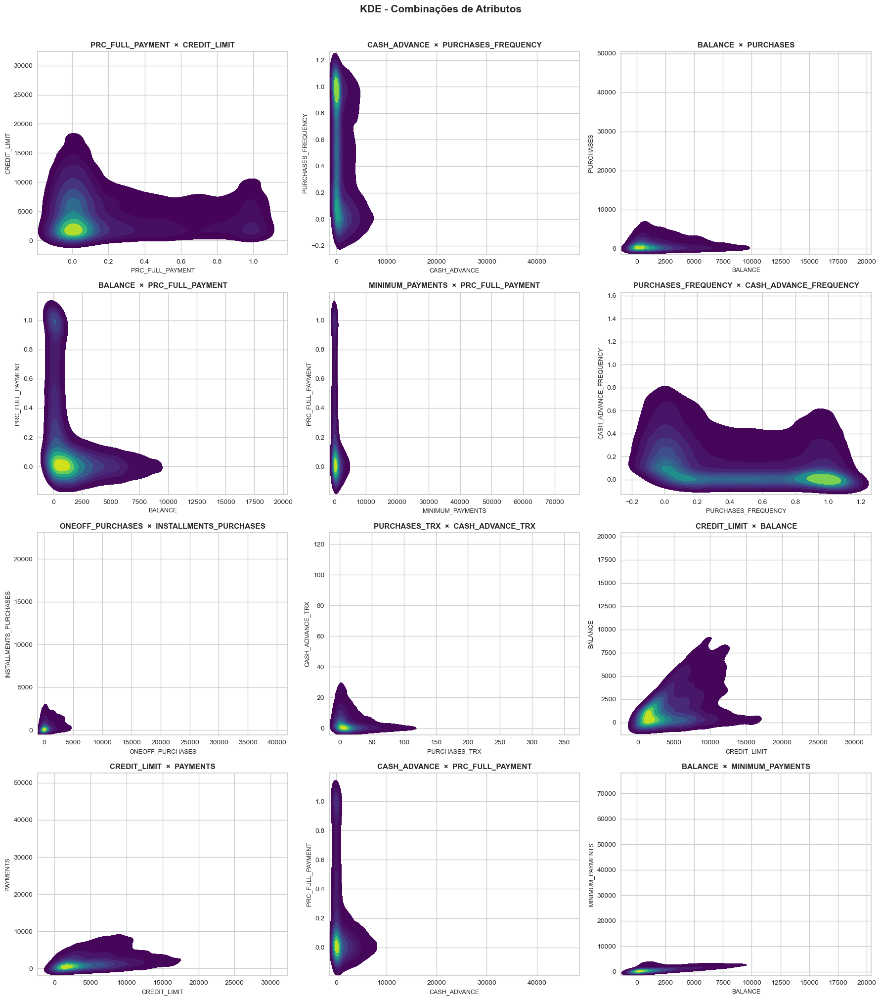

In [23]:
pairs = [  # Melhores candidatos que encontrei
    ("PRC_FULL_PAYMENT", "CREDIT_LIMIT"),
    ("CASH_ADVANCE", "PURCHASES_FREQUENCY"),
    ("BALANCE", "PURCHASES"),
    ("BALANCE", "PRC_FULL_PAYMENT"),
    ("MINIMUM_PAYMENTS", "PRC_FULL_PAYMENT"),
    ("PURCHASES_FREQUENCY", "CASH_ADVANCE_FREQUENCY"),
    ("ONEOFF_PURCHASES", "INSTALLMENTS_PURCHASES"),
    ("PURCHASES_TRX", "CASH_ADVANCE_TRX"),
    ("CREDIT_LIMIT", "BALANCE"),
    ("CREDIT_LIMIT", "PAYMENTS"),
    ("CASH_ADVANCE", "PRC_FULL_PAYMENT"),
    ("BALANCE", "MINIMUM_PAYMENTS"),
]

n_cols = 3
rows = len(pairs) // n_cols + (1 if len(pairs) % n_cols else 0)

fig, axes = plt.subplots(rows, n_cols, figsize=(18, rows * 5))
axes = axes.flatten()

for i, (x_col, y_col) in enumerate(pairs):
    sns.kdeplot(data=df, x=x_col, y=y_col, cmap="viridis", fill=True, ax=axes[i])
    axes[i].set_title(f"{x_col}  ×  {y_col}", fontsize=11, fontweight="bold")
    axes[i].set_xlabel(x_col, fontsize=9)
    axes[i].set_ylabel(y_col, fontsize=9)

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle("KDE - Combinações de Atributos", fontsize=15, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()

O primeiro gráfico é mais interpretavel. foi priorizado em relação ao sexto. Isso é porque ele pediu um scatter. mostrar só os importantes na apresentação

<Axes: xlabel='PRC_FULL_PAYMENT', ylabel='CREDIT_LIMIT'>

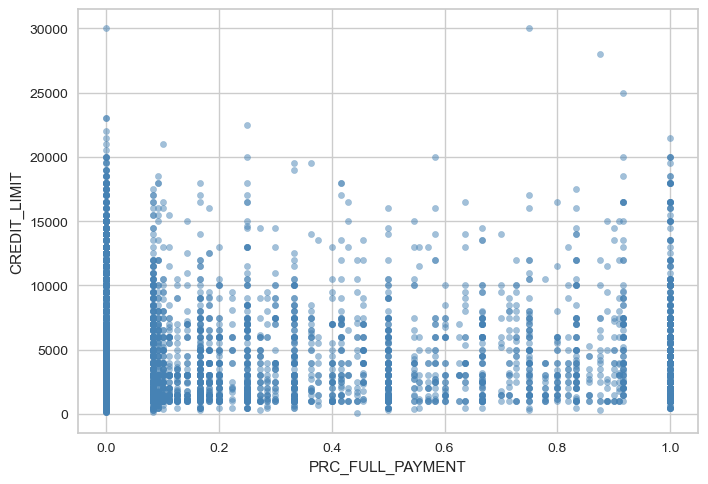

In [24]:
df.plot(kind="scatter", x="PRC_FULL_PAYMENT", y="CREDIT_LIMIT", alpha=0.5, color="steelblue")

Esse é o scatter plot que ele pediu 

## Seleção de variaveis (remoção de redundantes)

Foi usada correlação de spearman, pois os dados contém muitos outliers e forte assimetria.  
corr positiva: diretamente monotônica  
corr negativa: inversamente monotônica   
Relação monótona: se duas variáveis tendem a mudar juntas na mesma direção (direta ou inversamente), mas não necessariamente a uma taxa constante (linha reta).

<Axes: >

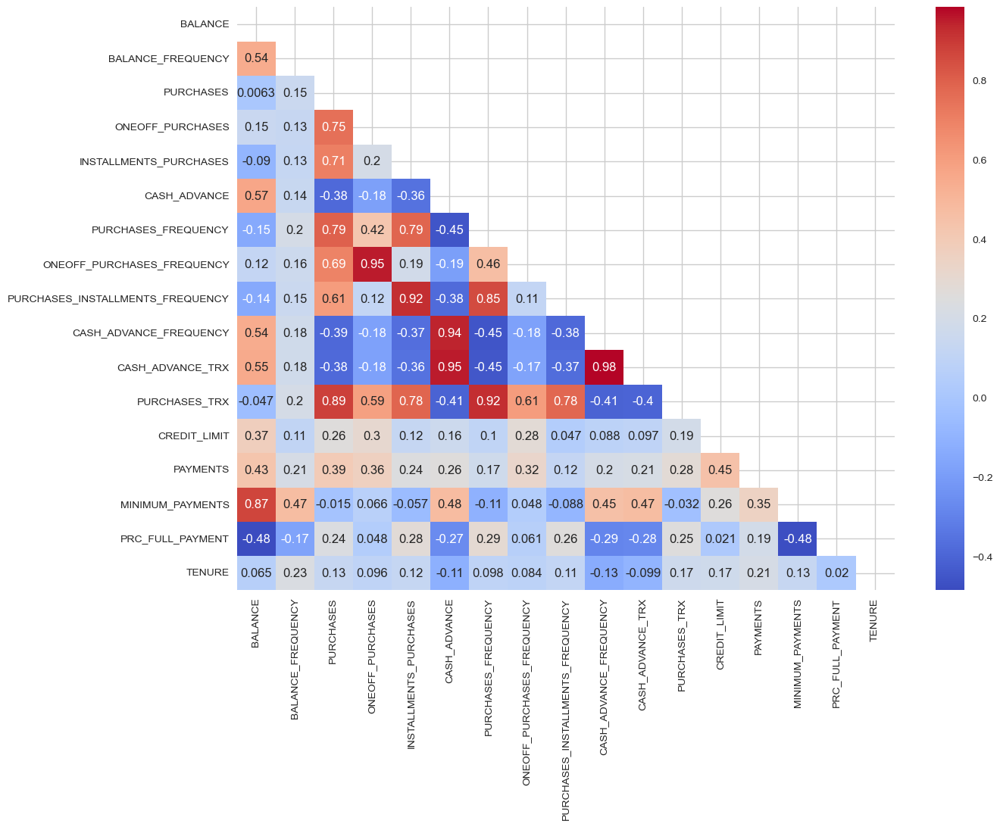

In [25]:
plt.figure(figsize=(14, 10))
corr = df.corr(method="spearman", numeric_only=True)
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True, cmap="coolwarm")

In [26]:
def show_correlated_pairs(X, threshold=0.80):
    corr = X.corr(method="spearman", numeric_only=True)

    upper = corr.where(
        np.triu(np.ones(corr.shape), k=1).astype(bool)
    )

    pairs = []

    for col in upper.columns:
        for row in upper.index:
            value = upper.loc[row, col]

            if pd.notna(value) and abs(value) >= threshold:
                pairs.append((abs(value), row, col, value))

    pairs.sort(reverse=True)

    print(f"Pares com |corr| >= {threshold}:\n")

    for _, var1, var2, corr_value in pairs:
        print(f"[{corr_value:.3f}] {var1} <--> {var2}")

    return pairs
pairs = show_correlated_pairs(df, threshold=0.75)

Pares com |corr| >= 0.75:

[0.983] CASH_ADVANCE_FREQUENCY <--> CASH_ADVANCE_TRX
[0.952] ONEOFF_PURCHASES <--> ONEOFF_PURCHASES_FREQUENCY
[0.952] CASH_ADVANCE <--> CASH_ADVANCE_TRX
[0.941] CASH_ADVANCE <--> CASH_ADVANCE_FREQUENCY
[0.924] PURCHASES_FREQUENCY <--> PURCHASES_TRX
[0.923] INSTALLMENTS_PURCHASES <--> PURCHASES_INSTALLMENTS_FREQUENCY
[0.885] PURCHASES <--> PURCHASES_TRX
[0.871] BALANCE <--> MINIMUM_PAYMENTS
[0.852] PURCHASES_FREQUENCY <--> PURCHASES_INSTALLMENTS_FREQUENCY
[0.795] PURCHASES <--> PURCHASES_FREQUENCY
[0.786] INSTALLMENTS_PURCHASES <--> PURCHASES_FREQUENCY
[0.784] INSTALLMENTS_PURCHASES <--> PURCHASES_TRX
[0.781] PURCHASES_INSTALLMENTS_FREQUENCY <--> PURCHASES_TRX
[0.751] PURCHASES <--> ONEOFF_PURCHASES


Uma coluna de cada par é removida de acordo com a priorização da regra de negócio, e menor perda de informação. a menos importante das colunas é removida, justificar as remoções. todos os pares tem ao menos uma removida.

In [27]:
vars_remover = [
    'CASH_ADVANCE_TRX',                   # contagem bruta → quase idêntica a CASH_ADVANCE_FREQUENCY (corr 0.98)
    'CASH_ADVANCE_FREQUENCY',             # frequência → substituída por CASH_ADVANCE (valor monetário mais informativo pra risco)
    'MINIMUM_PAYMENTS',                   # derivada → substituída por BALANCE
    'PURCHASES_TRX',                      # contagem bruta → substituída por PURCHASES
    'ONEOFF_PURCHASES',                   # subcomponente → capturado por PURCHASES
    'PURCHASES_FREQUENCY',                # frequência → optou-se pelo montante PURCHASES
    'INSTALLMENTS_PURCHASES',             # subcomponente → capturado por PURCHASES
    'PURCHASES_INSTALLMENTS_FREQUENCY',   # freq. parcelamento → removida em cascata
]

X_cut = df.drop(columns=vars_remover)

## Kmeans - Sem normalização

In [28]:
def make_kmeans(random_state=77, n_init=10, **kwargs):
    return KMeans(init="k-means++", random_state=random_state, n_init=n_init, **kwargs)

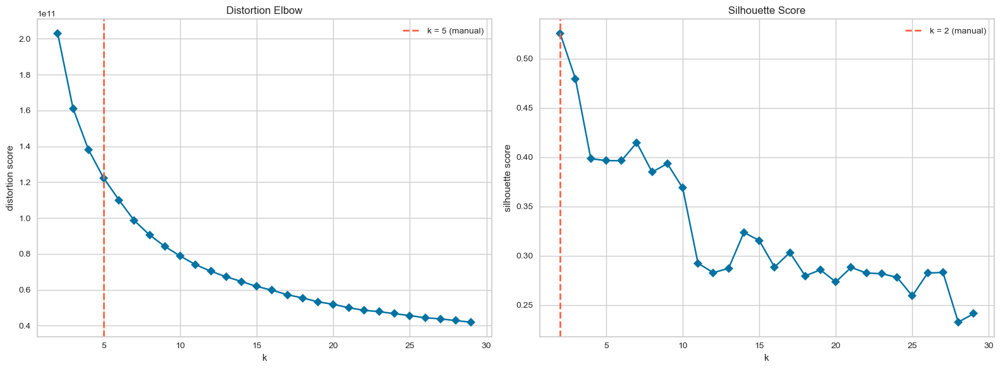

In [29]:
def _override_elbow_line(ax, k, titulo):
    """Remove a linha vertical automática do yellowbrick e insere a manual."""
    for line in list(ax.lines):
        xdata = np.array(line.get_xdata())
        if len(xdata) == 2 and xdata[0] == xdata[1]:  # linha vertical
            line.remove()

    ax.axvline(x=k, color='tomato', linestyle='--', linewidth=2, label=f'k = {k} (manual)')
    ax.set_title(titulo)
    ax.legend()


def get_silhoete_and_elbow(data, k_range=(2, 30), elbow_k=None, silhouette_k=None):

    model = make_kmeans()
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    elbow = KElbowVisualizer(
        model, k=k_range, metric='distortion', timings=False, ax=axes[0]
    )
    elbow.fit(data)
    elbow.finalize()

    if elbow_k is not None:
        _override_elbow_line(axes[0], elbow_k, f'Distortion Elbow')

    silhouette = KElbowVisualizer(
        model, k=k_range, metric='silhouette', timings=False, ax=axes[1]
    )
    silhouette.fit(data)
    silhouette.finalize()

    if silhouette_k is not None:
        _override_elbow_line(axes[1], silhouette_k, f'Silhouette Score')

    plt.tight_layout()
    plt.show()


get_silhoete_and_elbow(X_cut, elbow_k=5, silhouette_k=2)

A escolha de K tenta balancear os dois resultados

In [30]:
model = make_kmeans(random_state=67, n_clusters=3)
model.fit(X_cut)

X_cut["cluster"] = model.predict(X_cut)

In [31]:
def plot_clusters_scatter(x, y, labels, x_label, y_label, color_label="Cluster", title=None):
    plt.scatter(x, y, c=labels, cmap="viridis", alpha=0.6)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.colorbar(label=color_label)
    if title:
        plt.title(title)
    plt.show()


def plot_contingency(ct, x_label, y_label, title, figsize=(8, 4)):
    plt.figure(figsize=figsize)
    sns.heatmap(ct, annot=True, fmt="d", cmap="YlGnBu")
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.show()

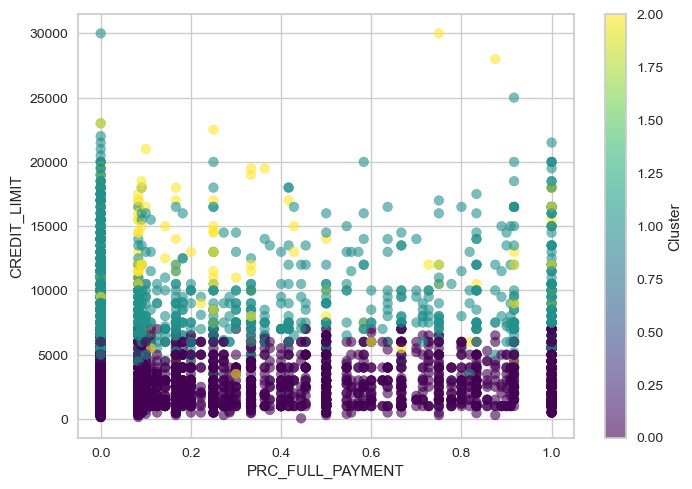

In [32]:
plot_clusters_scatter(
    X_cut["PRC_FULL_PAYMENT"],
    X_cut["CREDIT_LIMIT"],
    X_cut["cluster"],
    "PRC_FULL_PAYMENT",
    "CREDIT_LIMIT"
)

In [33]:
def discretize_sturges(X, feature):
    """Discretiza usando a regra de Sturges: k = ceil(log2(n) + 1) bins de largura igual."""
    n = len(X)
    k_bins = int(np.ceil(np.log2(n) + 1))

    data_min, data_max = X[feature].min(), X[feature].max()
    bins = np.linspace(data_min, data_max, k_bins + 1)
    labels = list(range(k_bins))

    discretized = pd.cut(X[feature], bins=bins, include_lowest=True, labels=labels).astype(int)
    return discretized, k_bins

A montagem do crosstab exige discretização, pois não há uma var target. 

In [34]:
col_to_discretize = 'CREDIT_LIMIT'
discrete_cols = pd.DataFrame()

discrete_cols[col_to_discretize], k_bins = discretize_sturges(X_cut, 'CREDIT_LIMIT')
print(f"{col_to_discretize} | Regra de Sturges: k = {k_bins} bins")

CREDIT_LIMIT | Regra de Sturges: k = 15 bins


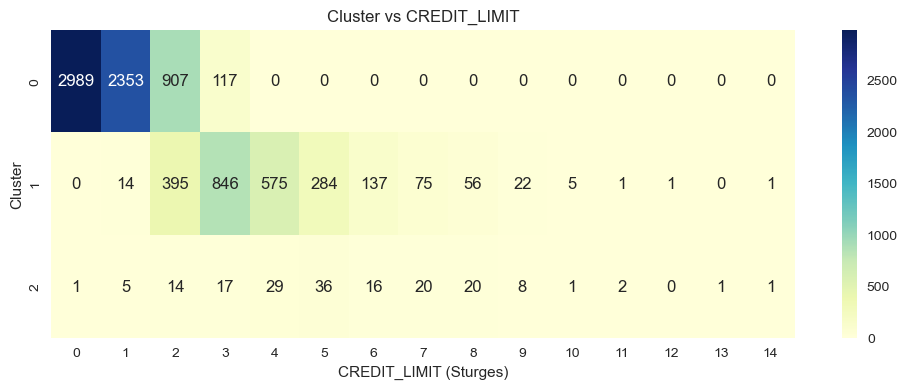

In [35]:
ct = pd.crosstab(
    X_cut["cluster"],
    discrete_cols[col_to_discretize]
)

plot_contingency(ct, f"{col_to_discretize} (Sturges)", "Cluster", f"Cluster vs {col_to_discretize}", figsize=(12, 4))

## Kmeans com normalização

In [36]:
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

normalizers = {
    "StandardScaler": StandardScaler(),
    "RobustScaler": RobustScaler(),
    "MinMaxScaler": MinMaxScaler(),
    "Log1p": None
}

manual_elbow_k_by_normalizer = {
    "StandardScaler": 7,
    "RobustScaler": 6,
    "MinMaxScaler": 3,
    "Log1p": 4,
}


In [37]:
from sklearn.metrics import silhouette_score


def compare_preprocessing_kmeans(X, k_range=(2, 30)):

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    star_handles_left  = []
    star_handles_right = []

    k_values = list(range(k_range[0], k_range[1] + 1))

    best_k_by_normalizer = {}

    for name, transformer in normalizers.items():

        if name == "Log1p":
            X_proc = np.log1p(X)
        else:
            X_proc = transformer.fit_transform(X)

        _dummy_fig, _dummy_ax = plt.subplots()
        model = make_kmeans()
        elbow = KElbowVisualizer(
            model, k=k_range, metric="distortion",
            timings=False, ax=_dummy_ax          
        )
        elbow.fit(X_proc)
        plt.close(_dummy_fig)                    

        line = axes[0].plot(
            elbow.k_values_,
            elbow.k_scores_,
            marker="o",
            label=name
        )[0]
        color = line.get_color()

        manual_k = manual_elbow_k_by_normalizer[name]
        idx = list(elbow.k_values_).index(manual_k)
        axes[0].scatter(
            manual_k, elbow.k_scores_[idx],
            marker="*", s=400, color=color,
            edgecolor="black", linewidth=1.5, zorder=10
        )
        star_handles_left.append(
            plt.Line2D([0], [0], marker="*", color="w",
                       markerfacecolor=color, markeredgecolor="black",
                       markersize=14, label=f"{name}  k={manual_k}")
        )

        sil_scores = np.array([
            silhouette_score(
                X_proc,
                make_kmeans(n_clusters=k).fit_predict(X_proc)
            )
            for k in k_values
        ])

        line_sil  = axes[1].plot(k_values, sil_scores, marker="o", label=name)[0]
        color_sil = line_sil.get_color()

        best_idx = int(np.argmax(sil_scores))
        best_k   = k_values[best_idx]
        best_k_by_normalizer[name] = best_k

        axes[1].scatter(
            best_k, sil_scores[best_idx],
            marker="*", s=400, color=color_sil,
            edgecolor="black", linewidth=1.5, zorder=10
        )
        star_handles_right.append(
            plt.Line2D([0], [0], marker="*", color="w",
                       markerfacecolor=color_sil, markeredgecolor="black",
                       markersize=14, label=f"{name}  k={best_k}")
        )

    axes[0].set_title("Elbow Method (Inertia)")
    axes[0].set_xlabel("Numero de Clusters (k)")
    axes[0].set_ylabel("Distortion / Inertia")
    axes[0].grid(alpha=0.3)

    axes[1].set_title("Silhouette Score")
    axes[1].set_xlabel("Numero de Clusters (k)")
    axes[1].set_ylabel("Silhouette")
    axes[1].grid(alpha=0.3)

    for ax, star_handles in zip(axes, [star_handles_left, star_handles_right]):
        line_handles, _ = ax.get_legend_handles_labels()
        separator = plt.Line2D([0], [0], color="none", label="─" * 21)

        ax.legend(
            handles=line_handles + [separator] + star_handles,
            title="Pre-processamento",
            loc="upper right",
            fontsize=15,
            title_fontsize=9
        )

    plt.tight_layout()
    plt.show()

    return best_k_by_normalizer

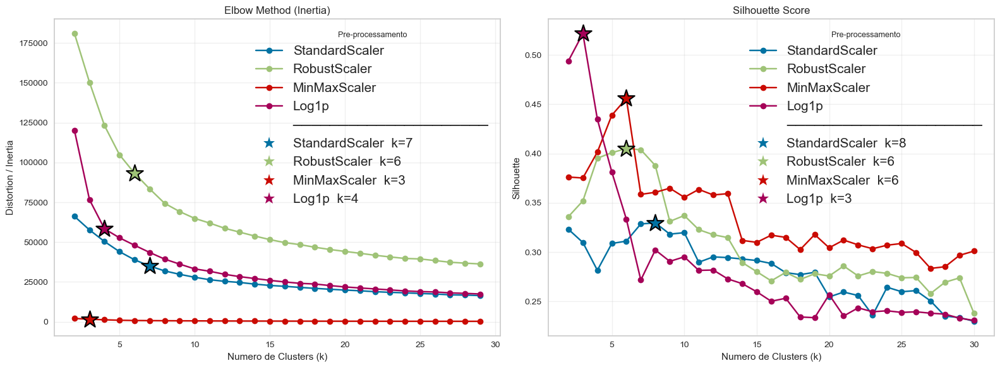

In [38]:
best_k_by_normalizer = compare_preprocessing_kmeans(X_cut.drop(columns=["cluster"]))

In [39]:
best_k_by_normalizer = {
    "StandardScaler": 7,
    "RobustScaler": 6,
    "MinMaxScaler": 6,
    "Log1p": 3
}

In [40]:
X_features = X_cut.drop(columns=["cluster"])

clusters_by_normalizer = {}

for name, transformer in normalizers.items():
    X_proc = np.log1p(X_features) if name == "Log1p" else transformer.fit_transform(X_features)

    model = make_kmeans(n_clusters=best_k_by_normalizer[name])

    clusters_by_normalizer[name] = pd.Series(model.fit_predict(X_proc), index=X_features.index)

In [41]:
def plot_scatter_by_group(clusters_by_name, x, y, x_label, y_label, titles=None):
    titles = titles or {}
    fig, axes = plt.subplots(1, len(clusters_by_name), figsize=(22, 5))

    for ax, (name, labels) in zip(axes, clusters_by_name.items()):
        ax.scatter(x, y, c=labels, cmap="viridis", alpha=0.6)
        ax.set_title(titles.get(name, name))
        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)

    plt.tight_layout()
    plt.show()


def plot_contingency_by_group(clusters_by_name, reference, x_label, y_label, titles=None):
    titles = titles or {}
    fig, axes = plt.subplots(1, len(clusters_by_name), figsize=(22, 5))

    for ax, (name, labels) in zip(axes, clusters_by_name.items()):
        ct = pd.crosstab(labels, reference)
        sns.heatmap(ct, annot=True, fmt="d", cmap="YlGnBu", ax=ax, cbar=False)
        ax.set_title(titles.get(name, name))
        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)

    plt.tight_layout()
    plt.show()

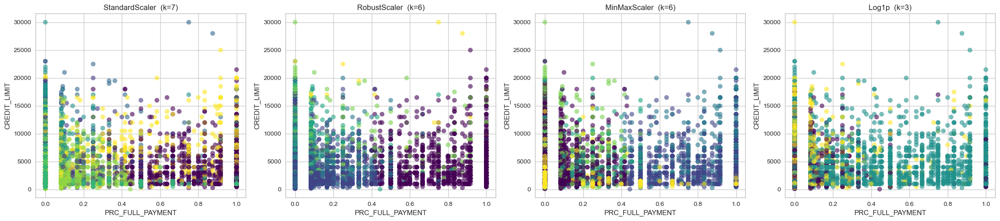

In [42]:
plot_scatter_by_group(
    clusters_by_normalizer,
    X_cut["PRC_FULL_PAYMENT"],
    X_cut["CREDIT_LIMIT"],
    "PRC_FULL_PAYMENT",
    "CREDIT_LIMIT",
    titles={name: f"{name}  (k={best_k_by_normalizer[name]})" for name in clusters_by_normalizer}
)

Provavel não serem as vars mais representativas para a classificação, mas manter assim para a comparação. tabelas ficariam melhor com PCA's. poderia ver o crosstab para outras, mas isso não é cobrado

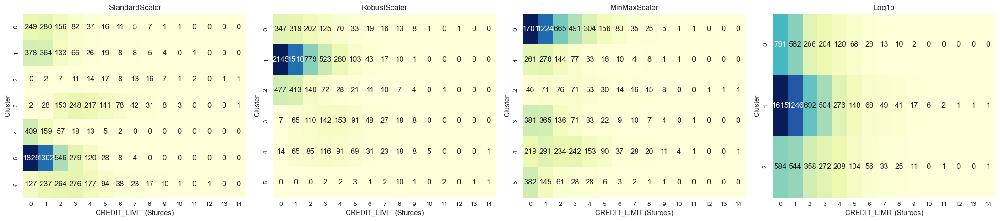

In [43]:
plot_contingency_by_group(
    clusters_by_normalizer,
    discrete_cols[col_to_discretize],
    f"{col_to_discretize} (Sturges)",
    "Cluster"
)

## DBSCAN sem normalização

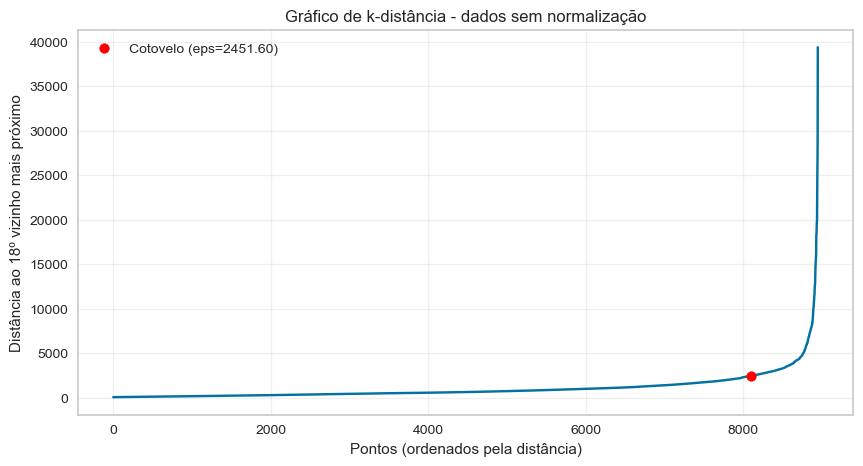

In [44]:
from sklearn.neighbors import NearestNeighbors

X_cut_features = X_cut.drop(columns=["cluster"])

nn = NearestNeighbors(n_neighbors=18).fit(X_cut_features)
distances, _ = nn.kneighbors(X_cut_features)
k_distances = np.sort(distances[:, -1])

# Índice do cotovelo escolhido manualmente (olhando o gráfico abaixo); edite aqui pra mudar.
dbscan_elbow_idx_no_norm = 8100
elbow_value = k_distances[dbscan_elbow_idx_no_norm]

plt.figure(figsize=(10, 5))
plt.plot(k_distances)
plt.scatter(dbscan_elbow_idx_no_norm, elbow_value, color="red", zorder=5, label=f"Cotovelo (eps={elbow_value:.2f})")
plt.legend()
plt.xlabel("Pontos (ordenados pela distância)")
plt.ylabel("Distância ao 18º vizinho mais próximo")
plt.title("Gráfico de k-distância - dados sem normalização")
plt.grid(alpha=0.3)
plt.show()

Ponto escolhido antes da subida mais íngreme

In [45]:
from sklearn.cluster import DBSCAN

def evaluate_dbscan(X, eps, min_samples, sample_size=None, random_state=None):
    db = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
    labels = db.fit_predict(X)

    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    mask = labels != -1

    score = np.nan
    if n_clusters >= 2:
        effective_sample_size = min(sample_size, mask.sum()) if sample_size is not None else None
        try:
            score = silhouette_score(
                X[mask], labels[mask],
                sample_size=effective_sample_size,
                random_state=random_state
            )
        except ValueError:
            pass

    result = pd.DataFrame([{
        "eps":        eps,
        "min_samples": min_samples,
        "clusters":   n_clusters,
        "noise_pct":  (labels == -1).mean() * 100,
        "silhouette": score
    }])

    labels_series = pd.Series(labels, index=X.index if hasattr(X, 'index') else None)

    return result, labels_series


min_samples = X_cut_features.shape[1] * 2

dbscan_results_no_norm, dbscan_labels_no_norm = evaluate_dbscan(
    X_cut_features, eps=elbow_value, min_samples=min_samples
)
dbscan_results_no_norm

,eps,min_samples,clusters,noise_pct,silhouette
0,2451.595889,18,1,5.844228,NaN


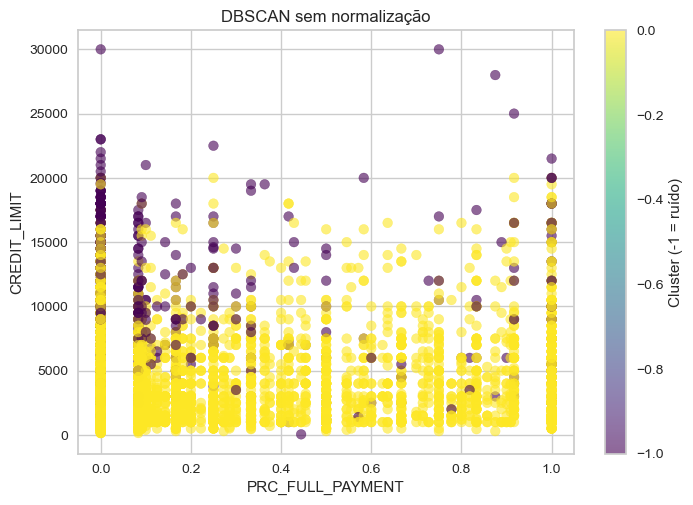

In [46]:
plot_clusters_scatter(
    X_cut["PRC_FULL_PAYMENT"],
    X_cut["CREDIT_LIMIT"],
    dbscan_labels_no_norm,
    "PRC_FULL_PAYMENT",
    "CREDIT_LIMIT",
    color_label="Cluster (-1 = ruído)",
    title=f"DBSCAN sem normalização"
)


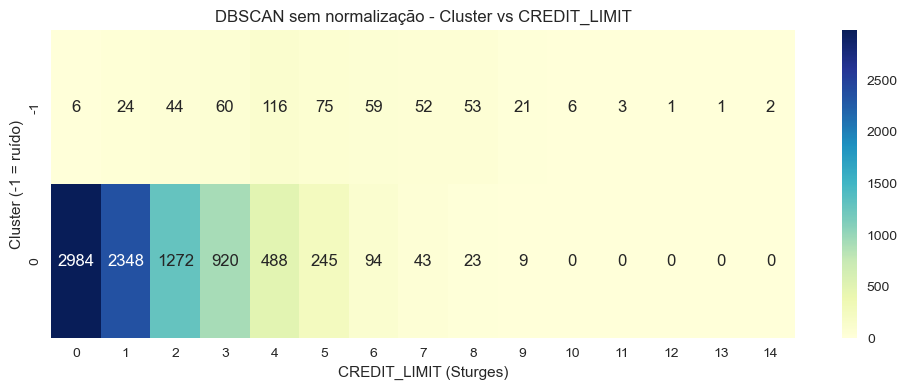

In [47]:
ct_dbscan_no_norm = pd.crosstab(dbscan_labels_no_norm, discrete_cols[col_to_discretize])

plot_contingency(
    ct_dbscan_no_norm,
    f"{col_to_discretize} (Sturges)",
    "Cluster (-1 = ruído)",
    f"DBSCAN sem normalização - Cluster vs {col_to_discretize}",
    figsize=(12, 4)
)

## DBSCAN com normalização

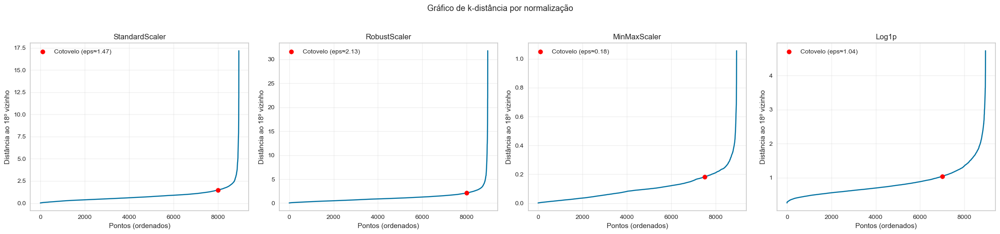

In [48]:
min_samples = X_cut_features.shape[1] * 2

dbscan_elbow_idx_by_normalizer = {
    "StandardScaler": 8000,
    "RobustScaler":   8000,
    "MinMaxScaler":   7500,
    "Log1p":          7000,
}

fig, axes = plt.subplots(1, 4, figsize=(22, 5))

k_distances_by_normalizer = {}

for ax, (name, normalizer) in zip(axes, normalizers.items()):
    X_transformed = np.log1p(X_cut_features) if normalizer is None else normalizer.fit_transform(X_cut_features)

    nn = NearestNeighbors(n_neighbors=min_samples).fit(X_transformed)
    distances, _ = nn.kneighbors(X_transformed)
    k_dist = np.sort(distances[:, -1])
    k_distances_by_normalizer[name] = k_dist

    elbow_idx = dbscan_elbow_idx_by_normalizer[name]

    ax.plot(k_dist)
    ax.scatter(elbow_idx, k_dist[elbow_idx], color="red", zorder=5,
               label=f"Cotovelo (eps≈{k_dist[elbow_idx]:.2f})")
    ax.legend()
    ax.set_title(name)
    ax.set_xlabel("Pontos (ordenados)")
    ax.set_ylabel(f"Distância ao {min_samples}º vizinho")
    ax.grid(alpha=0.3)

plt.suptitle("Gráfico de k-distância por normalização", y=1.02, fontsize=13)
plt.tight_layout()
plt.show()

In [49]:
def compare_dbscan_params_normalizations(X):
    all_results = []
    labels_by_normalizer = {}

    for name, normalizer in normalizers.items():
        X_transformed = np.log1p(X) if normalizer is None else normalizer.fit_transform(X)

        elbow_idx = dbscan_elbow_idx_by_normalizer[name]
        eps       = k_distances_by_normalizer[name][elbow_idx]

        result_df, labels = evaluate_dbscan(
            X_transformed,
            eps=eps,
            min_samples=min_samples,
            sample_size=1000,
            random_state=42
        )

        result_df["normalizer"]    = name
        labels_by_normalizer[name] = labels
        all_results.append(result_df)

    return pd.concat(all_results, ignore_index=True), labels_by_normalizer


dbscan_results_norm, dbscan_labels_by_normalizer = compare_dbscan_params_normalizations(X_cut_features)

dbscan_results_norm

,eps,min_samples,clusters,noise_pct,silhouette,normalizer
0,1.474905,18,1,5.050844,NaN,StandardScaler
1,2.125528,18,1,5.430774,NaN,RobustScaler
2,0.182086,18,3,8.403174,0.114550,MinMaxScaler
3,1.040208,18,4,11.006816,0.568313,Log1p


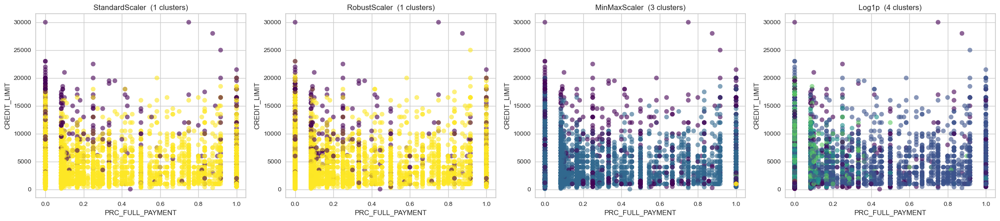

In [50]:
plot_scatter_by_group(
    dbscan_labels_by_normalizer,
    X_cut["PRC_FULL_PAYMENT"],
    X_cut["CREDIT_LIMIT"],
    "PRC_FULL_PAYMENT",
    "CREDIT_LIMIT",
    titles={
        name: f"{name}  ({labels[labels != -1].nunique()} clusters)"
        for name, labels in dbscan_labels_by_normalizer.items()
    }
)

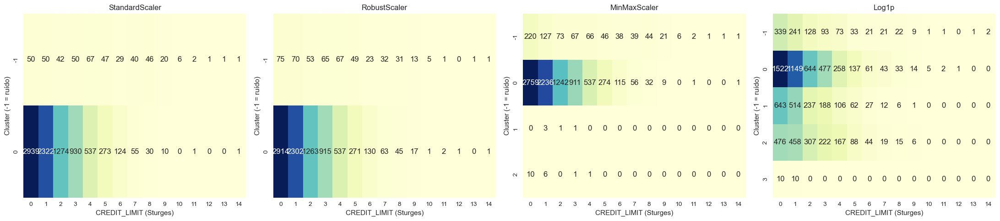

In [51]:
plot_contingency_by_group(
    dbscan_labels_by_normalizer,
    discrete_cols[col_to_discretize],
    f"{col_to_discretize} (Sturges)",
    "Cluster (-1 = ruído)"
)

## Clusterização hierarquica

In [52]:
X_cut_scaled = RobustScaler().fit_transform(X_cut_features)

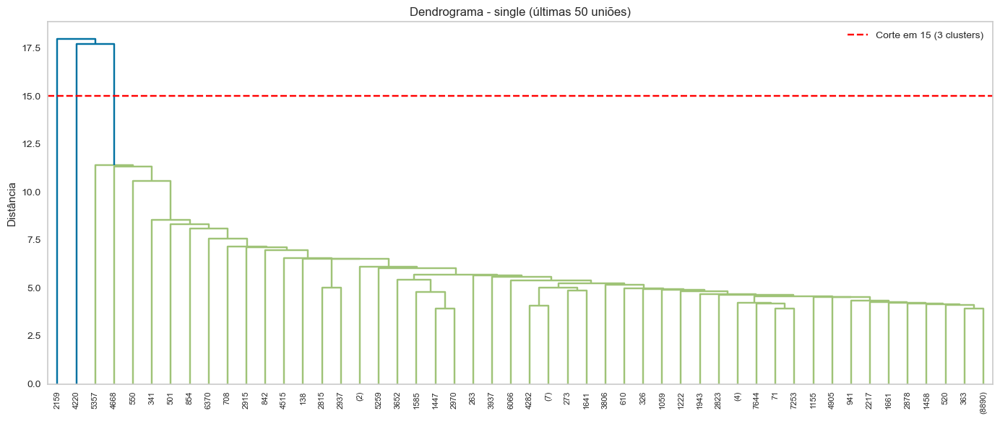

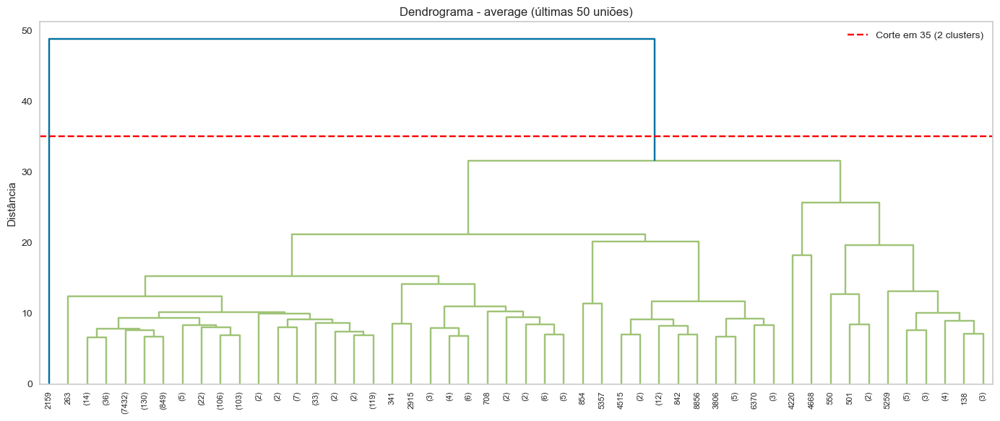

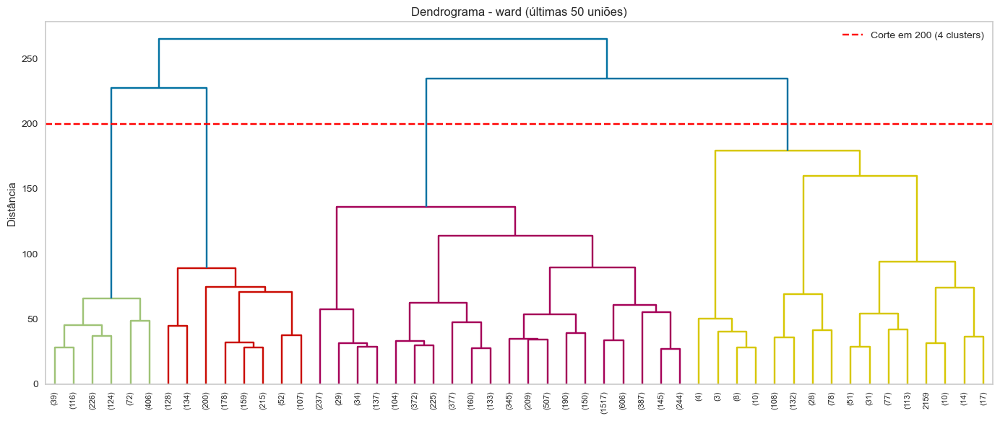

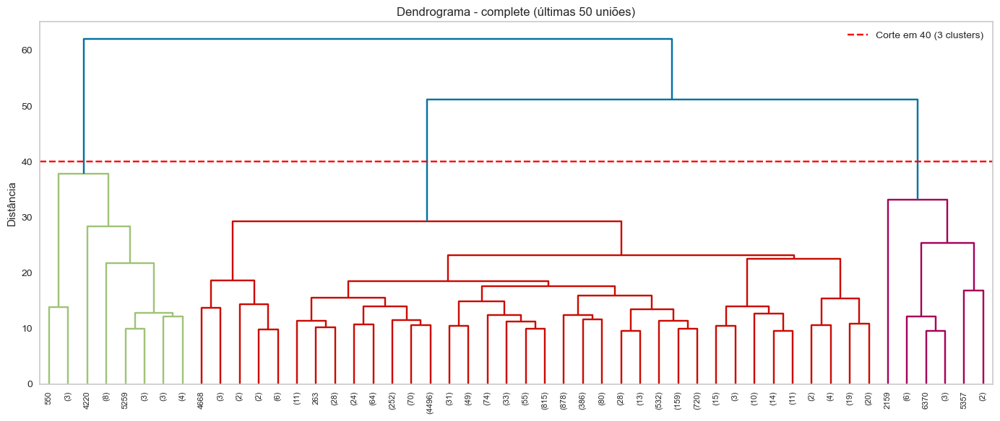

In [53]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

methods_cuts = {"single": 15, "average": 35, "ward": 200, "complete": 40}
hierarchical_labels = {}
for metd, cut_height in methods_cuts.items():

    Z = linkage(X_cut_scaled, method=metd, metric="euclidean")

    labels = fcluster(Z, t=cut_height, criterion="distance") - 1  # 0-based
    n_clusters_suggested = len(np.unique(labels))
    hierarchical_labels[f"hierarchical_{metd}"] = labels          # << salva

    plt.figure(figsize=(14, 6))
    dendrogram(Z, truncate_mode="lastp", p=50, show_leaf_counts=True, leaf_rotation=90)
    plt.axhline(y=cut_height, color="red", linestyle="--",
                label=f"Corte em {cut_height} ({n_clusters_suggested} clusters)")
    plt.legend()
    plt.title(f"Dendrograma - {metd} (últimas 50 uniões)")
    plt.ylabel("Distância")
    plt.grid(False)
    plt.tight_layout()
    plt.show()

O corte é realizado na maior distância vertical entre fusões consecutivas, pois dessa forma os grupos definidos são bem separados entre si

In [54]:
from sklearn.cluster import AgglomerativeClustering

cluster_target_models = {
    "agglomerative_ward": AgglomerativeClustering(n_clusters=4, linkage="ward"),
    "kmeans": make_kmeans(n_clusters=2),
    **hierarchical_labels,
}

TARGET_MODEL = "hierarchical_ward"   # troque aqui para usar outro método

target_source = cluster_target_models[TARGET_MODEL]

if isinstance(target_source, np.ndarray):
    target_labels = target_source
else:
    target_labels = target_source.fit_predict(X_cut_scaled)

pd.Series(target_labels).value_counts()

2    6108
1    1173
0     983
3     685
Name: count, dtype: int64

O modelo aglomerativo com ward foi usado para gerar a coluna cluster, que foi a target dos modelos supervisionados

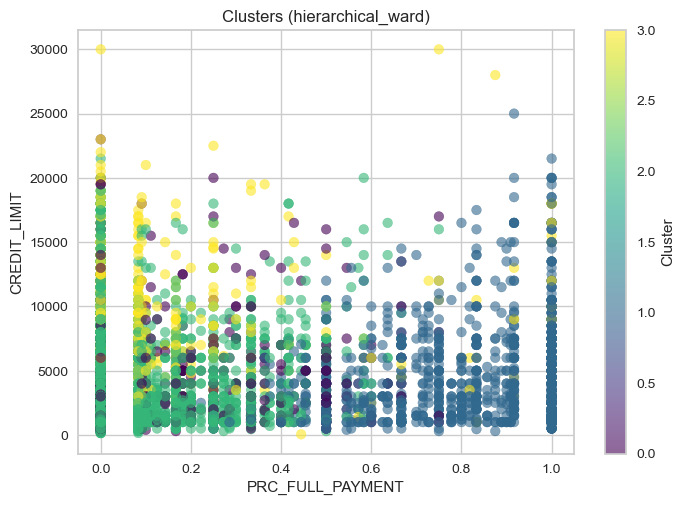

In [55]:
plot_clusters_scatter(
    X_cut["PRC_FULL_PAYMENT"],
    X_cut["CREDIT_LIMIT"],
    target_labels,
    "PRC_FULL_PAYMENT",
    "CREDIT_LIMIT",
    title=f"Clusters ({TARGET_MODEL})"
)

Achei que isso seria necessário para justificar a escolha do ward pra proxima etapa. 2 clusters são ruído mas dois são interpretaveis. pagadores bons-ruins. ficou mais simples que o kmeans com robustscaler que gerou 6 grupos

## Exploração da clusterização com PCA

In [56]:
from mpl_toolkits.mplot3d import Axes3D


shared_pca = PCA(random_state=77)  

def plot_top_pca_components(X, n_components=None, top_n=10, pca=shared_pca):
    X_scaled = RobustScaler().fit_transform(X)

    if not hasattr(pca, "components_"):  
        pca.n_components = n_components
        pca.fit(X_scaled)

    explained_var = pca.explained_variance_ratio_

    result_df = pd.DataFrame({
        "Componente": [f"PC{i}" for i in range(1, len(explained_var) + 1)],
        "Variancia_Explicada": explained_var,
        "Variancia_Acumulada": np.cumsum(explained_var)
    })
    result_df = result_df.sort_values("Variancia_Explicada", ascending=False).head(top_n)

    plt.figure(figsize=(10, 5))
    plt.bar(result_df["Componente"], result_df["Variancia_Explicada"])
    plt.xlabel("Componente Principal")
    plt.ylabel("Variância Explicada")
    plt.title(f"Top {top_n} Componentes Mais Importantes")
    plt.tight_layout()
    plt.show()

    return result_df


def plot_pca_3d(X, y=None, scaler=RobustScaler(), pca=shared_pca):
    X_scaled = scaler.fit_transform(X)

    if not hasattr(pca, "components_"):
        pca.n_components = 3
        X_pca = pca.fit_transform(X_scaled)
    else:
        X_pca = pca.transform(X_scaled)[:, :3] 

    var = pca.explained_variance_ratio_[:3]

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection="3d")

    if y is not None:
        scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=y, alpha=0.7, cmap="tab10")
        plt.colorbar(scatter)
    else:
        ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], alpha=0.7)

    ax.set_xlabel(f"PC1 ({var[0]:.1%})")
    ax.set_ylabel(f"PC2 ({var[1]:.1%})")
    ax.set_zlabel(f"PC3 ({var[2]:.1%})")
    ax.set_title(f"PCA 3D - Variância acumulada: {var[:3].sum():.1%}")

    plt.tight_layout()
    plt.show()

    return X_pca, pca

def plot_pca_2d(X, y=None, scaler=RobustScaler(), pca=shared_pca):

    X_scaled = scaler.fit_transform(X)

    if not hasattr(pca, "components_"):
        pca.n_components = 2
        X_pca = pca.fit_transform(X_scaled)
    else:
        X_pca = pca.transform(X_scaled)[:, :2]

    var = pca.explained_variance_ratio_[:2]

    fig, ax = plt.subplots(figsize=(10, 7))

    if y is not None:
        scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=y, alpha=0.7, cmap="tab10")
        plt.colorbar(scatter, ax=ax)
    else:
        ax.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.7)

    ax.set_xlabel(f"PC1 ({var[0]:.1%})")
    ax.set_ylabel(f"PC2 ({var[1]:.1%})")
    ax.set_title(f"PCA 2D - Variância acumulada: {var[:2].sum():.1%}")
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    return X_pca

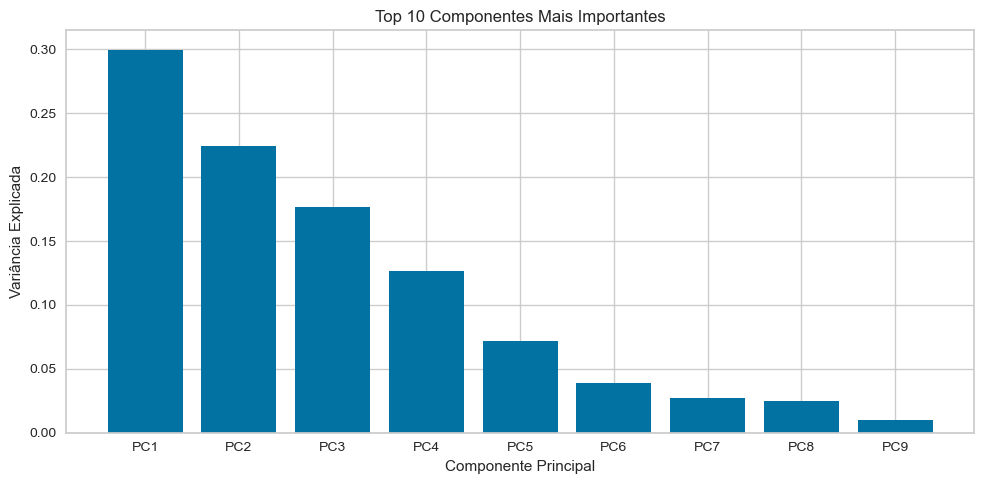

,Componente,Variancia_Explicada,Variancia_Acumulada
0,PC1,0.299873,0.299873
1,PC2,0.224638,0.524511
2,PC3,0.176359,0.700870
3,PC4,0.126221,0.827091
4,PC5,0.071638,0.898728
5,PC6,0.039178,0.937906
6,PC7,0.027391,0.965297
7,PC8,0.024581,0.989878
8,PC9,0.010122,1.000000


In [57]:
plot_top_pca_components(X_cut_features, top_n=10)

Manter somente os 4 principais para evitar ruído

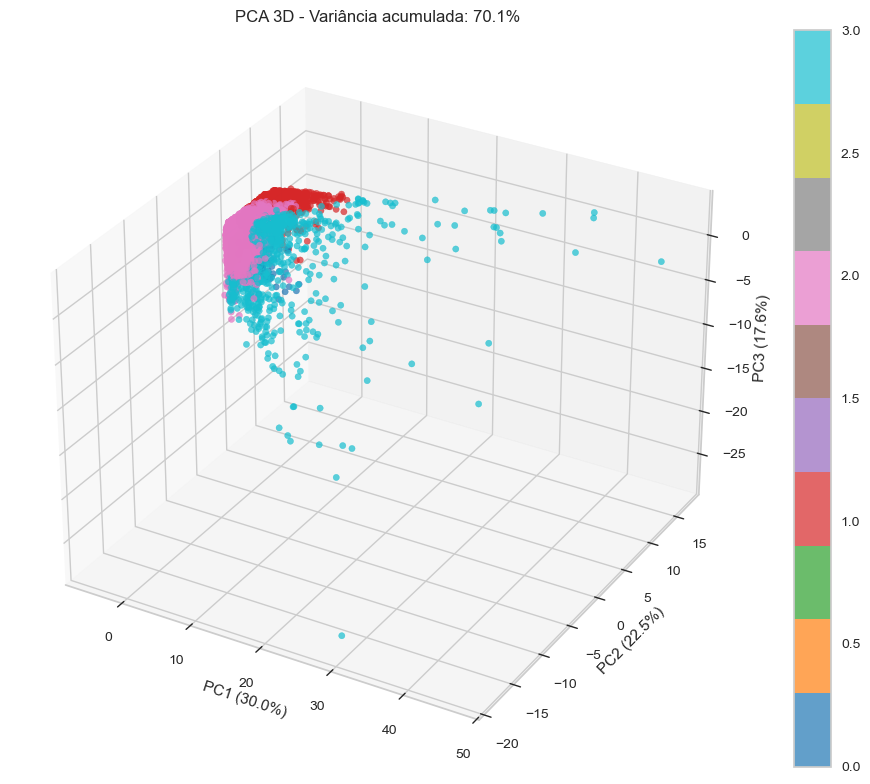

(array([[-1.98287758, -0.34437019,  0.12847291],
        [ 2.23679215, -2.31191547, -2.8639545 ],
        [ 0.02210693, -0.83777863,  1.73005528],
        ...,
        [-2.22520602,  0.86304398, -0.25883997],
        [-2.32065519,  0.80799417, -0.28379565],
        [-1.90973805,  0.69865533, -1.24124291]], shape=(8949, 3)),
 PCA(random_state=77))

In [58]:
plot_pca_3d(X_cut_features, y=target_labels)

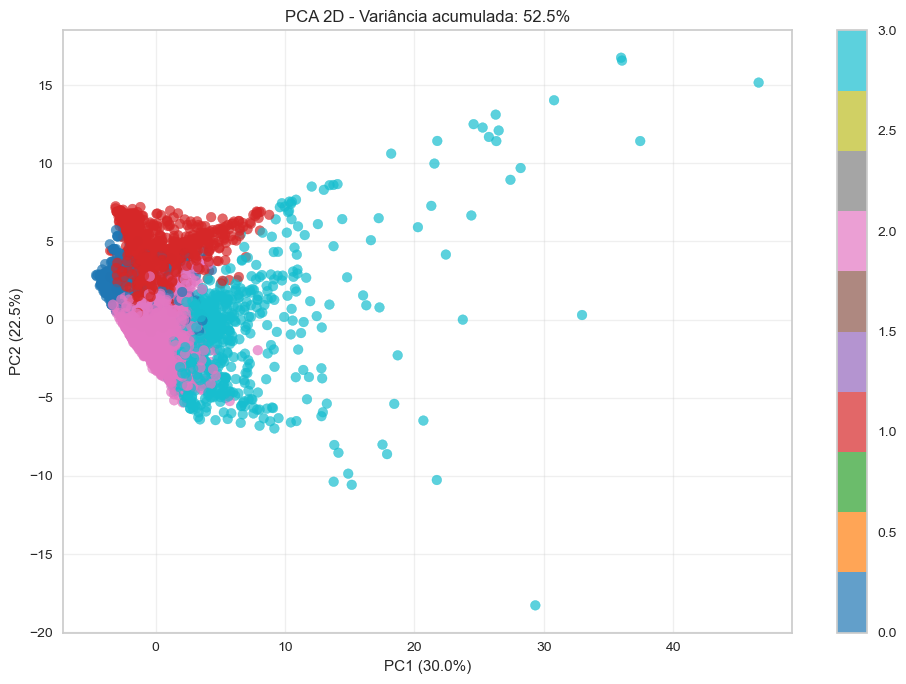

array([[-1.98287758, -0.34437019],
       [ 2.23679215, -2.31191547],
       [ 0.02210693, -0.83777863],
       ...,
       [-2.22520602,  0.86304398],
       [-2.32065519,  0.80799417],
       [-1.90973805,  0.69865533]], shape=(8949, 2))

In [59]:
plot_pca_2d(X_cut_features, y=target_labels)

É possivel definir bem os grupos 0 e 3 com esse gráfico (dar nomes para eles)

## Questão 7 - Classificação supervisionada (KNN e Árvore de Decisão)

divisão foi estratificada para manter conjuntos balanceadas, não aplicado kfold pois ele não cobrou

In [60]:
X_train_clf, X_test_clf, y_train_clf, y_test_clf = train_test_split(
    X_cut_features, target_labels,
    test_size=0.2, random_state=77, stratify=target_labels
)

Para os modelos com PCA, a norm é aplicada para o fit do PCA, para as demais, aplicada diretamente nos dados

In [61]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

knn_normalizers = {
    "StandardScaler": StandardScaler(),
    "MinMaxScaler": MinMaxScaler(),
    "Log1p": None
}

knn_results = []
knn_confusion = {}
knn_best_results = []

for norm_name, normalizer in knn_normalizers.items():
    if normalizer is None:
        X_train_proc = np.log1p(X_train_clf)
        X_test_proc = np.log1p(X_test_clf)
    else:
        X_train_proc = normalizer.fit_transform(X_train_clf)
        X_test_proc = normalizer.transform(X_test_clf)

    pca4 = PCA(n_components=4, random_state=77)
    X_train_pca = pca4.fit_transform(X_train_proc)
    X_test_pca = pca4.transform(X_test_proc)

    feature_sets = {
        "Todas as colunas": (X_train_proc, X_test_proc),
        "Top 4 PCA": (X_train_pca, X_test_pca),
    }

    for feature_set_name, (X_tr, X_te) in feature_sets.items():
        best_for_combo = None

        for n_neighbors in range(2, 21):
            knn = KNeighborsClassifier(n_neighbors=n_neighbors)
            knn.fit(X_tr, y_train_clf)
            y_pred = knn.predict(X_te)

            report = classification_report(y_test_clf, y_pred, output_dict=True)
            acc = report["accuracy"]

            knn_results.append({
                "normalizacao": norm_name,
                "features": feature_set_name,
                "n_neighbors": n_neighbors,
                "accuracy": acc,
                "precision": report["weighted avg"]["precision"],
                "recall": report["weighted avg"]["recall"],
                "f1": report["weighted avg"]["f1-score"],
            })

            if best_for_combo is None or acc > best_for_combo["accuracy"]:
                best_for_combo = {
                    "n_neighbors": n_neighbors,
                    "accuracy": acc,
                    "y_pred": y_pred,
                    "report": report,
                }

        knn_confusion[(norm_name, feature_set_name)] = confusion_matrix(
            y_test_clf, best_for_combo["y_pred"]
        )

        knn_best_results.append({
            "normalizacao": norm_name,
            "features": feature_set_name,
            "n_neighbors": best_for_combo["n_neighbors"],
            "accuracy": best_for_combo["accuracy"],
            "precision": best_for_combo["report"]["weighted avg"]["precision"],
            "recall": best_for_combo["report"]["weighted avg"]["recall"],
            "f1": best_for_combo["report"]["weighted avg"]["f1-score"],
        })

norm_order = ["StandardScaler", "MinMaxScaler", "Log1p"]
features_order = ["Todas as colunas", "Top 4 PCA"]

knn_best_results_df = pd.DataFrame(knn_best_results)
knn_best_results_df["normalizacao"] = pd.Categorical(
    knn_best_results_df["normalizacao"], categories=norm_order, ordered=True
)
knn_best_results_df["features"] = pd.Categorical(
    knn_best_results_df["features"], categories=features_order, ordered=True
)
knn_best_results_df = knn_best_results_df.sort_values(["normalizacao", "features"]).reset_index(drop=True)
knn_best_results_df

,normalizacao,features,n_neighbors,accuracy,precision,recall,f1
0,StandardScaler,Todas as colunas,3,0.984916,0.984882,0.984916,0.984874
1,StandardScaler,Top 4 PCA,8,0.951955,0.951522,0.951955,0.950891
2,MinMaxScaler,Todas as colunas,7,0.956983,0.956416,0.956983,0.954190
3,MinMaxScaler,Top 4 PCA,4,0.931285,0.927421,0.931285,0.921285
4,Log1p,Todas as colunas,3,0.894972,0.893057,0.894972,0.893615
5,Log1p,Top 4 PCA,20,0.851397,0.853684,0.851397,0.848773


São pegos os melhores f1 score para os modelos testandos no intervalo 2-20 para K

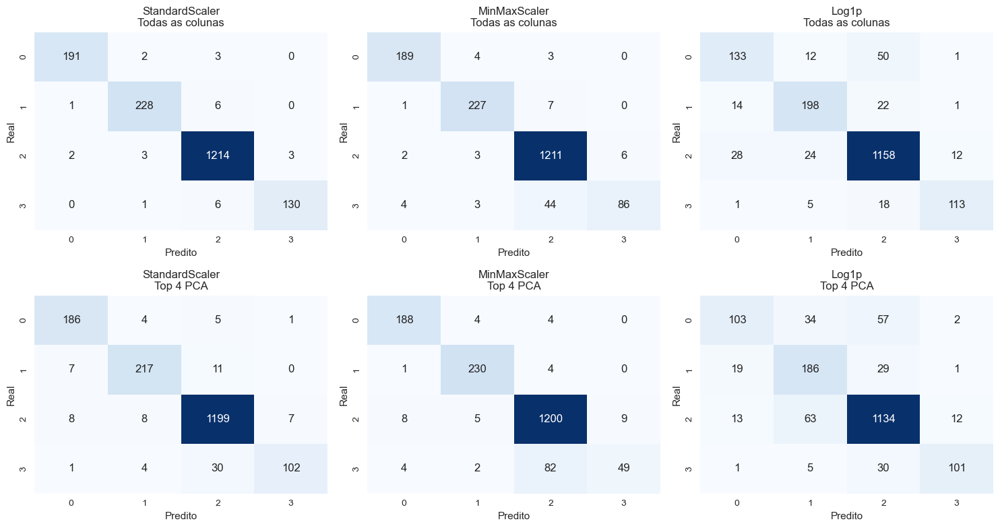

In [62]:
feature_set_names = ["Todas as colunas", "Top 4 PCA"]

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

for row, feature_set_name in enumerate(feature_set_names):
    for col, norm_name in enumerate(knn_normalizers.keys()):
        ax = axes[row, col]
        cm = knn_confusion[(norm_name, feature_set_name)]
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=ax, cbar=False)
        ax.set_title(f"{norm_name}\n{feature_set_name}")
        ax.set_xlabel("Predito")
        ax.set_ylabel("Real")

plt.tight_layout()
plt.show()

PCA leva StandardScaler, pois é precisa normalizar com algo, apenas ele é testado

=== Árvore de Decisão | Todas as colunas ===
              precision    recall  f1-score   support

           0       0.93      0.94      0.94       196
           1       0.95      0.96      0.96       235
           2       0.98      0.97      0.98      1222
           3       0.85      0.93      0.89       137

    accuracy                           0.96      1790
   macro avg       0.93      0.95      0.94      1790
weighted avg       0.96      0.96      0.96      1790



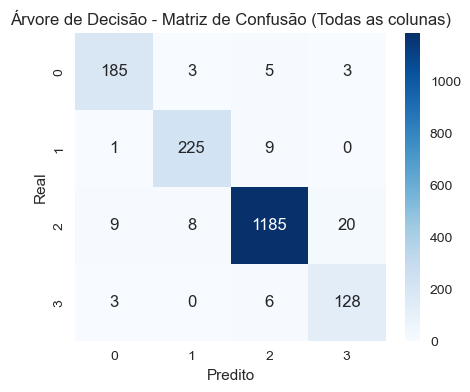

=== Árvore de Decisão | Top 4 PCA ===
              precision    recall  f1-score   support

           0       0.86      0.89      0.88       196
           1       0.89      0.83      0.86       235
           2       0.96      0.97      0.97      1222
           3       0.82      0.81      0.82       137

    accuracy                           0.93      1790
   macro avg       0.88      0.88      0.88      1790
weighted avg       0.93      0.93      0.93      1790



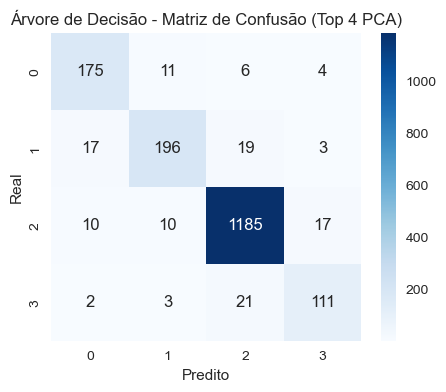

,features,accuracy,precision,recall,f1
0,Todas as colunas,0.962570,0.963703,0.962570,0.962939
1,Top 4 PCA,0.931285,0.930995,0.931285,0.930966


In [63]:
from sklearn.feature_selection import VarianceThreshold
from sklearn.tree import DecisionTreeClassifier


scaler_for_tree_pca = StandardScaler()
X_train_tree_scaled = scaler_for_tree_pca.fit_transform(X_train_clf)
X_test_tree_scaled = scaler_for_tree_pca.transform(X_test_clf)

pca4_tree = PCA(n_components=4, random_state=77)
X_train_tree_pca = pca4_tree.fit_transform(X_train_tree_scaled)
X_test_tree_pca = pca4_tree.transform(X_test_tree_scaled)

tree_feature_sets = {
    "Todas as colunas": (X_train_clf, X_test_clf),
    "Top 4 PCA": (X_train_tree_pca, X_test_tree_pca),
}

tree_results = []
tree_models = {}

for feature_set_name, (X_tr, X_te) in tree_feature_sets.items():
    tree_pipeline = Pipeline([
        ("feature_selection", VarianceThreshold(threshold=0.01)),
        ("tree", DecisionTreeClassifier(random_state=77)), # Critério padrão é o Gini
    ])

    tree_pipeline.fit(X_tr, y_train_clf)
    y_pred_tree = tree_pipeline.predict(X_te)

    print(f"=== Árvore de Decisão | {feature_set_name} ===")
    print(classification_report(y_test_clf, y_pred_tree))

    report = classification_report(y_test_clf, y_pred_tree, output_dict=True)
    tree_cm = confusion_matrix(y_test_clf, y_pred_tree)
    tree_models[feature_set_name] = tree_pipeline

    tree_results.append({
        "features": feature_set_name,
        "accuracy": report["accuracy"],
        "precision": report["weighted avg"]["precision"],
        "recall": report["weighted avg"]["recall"],
        "f1": report["weighted avg"]["f1-score"],
    })

    plt.figure(figsize=(5, 4))
    sns.heatmap(tree_cm, annot=True, fmt="d", cmap="Blues")
    plt.xlabel("Predito")
    plt.ylabel("Real")
    plt.title(f"Árvore de Decisão - Matriz de Confusão ({feature_set_name})")
    plt.show()

tree_results_df = pd.DataFrame(tree_results).sort_values("f1", ascending=False).reset_index(drop=True)
tree_results_df